# Antibiotics Design: Oxalidinone

> ### In this tutorial we will cover:
> - restricting molecule generation with an `Assembler`
> - ADMET-guided and docking-scored optimisation using a `Generator`

This is going to be a bigger one, so strap in! 

Here we are going to dive a little deeper into the gears of a 

..... UPDAET DOCS

In this tutorial we combine concepts from two other tutorials on using custom fragment libraries from BRICS and ChEMBL together with `admet-ai`-driven ADMET scoring and the `Generator` class to perform a molecular generation loop. If you are unfamiliar with either the library creation or the basic Generator usage, check out the other tutorials first (they are really short). 

Since we will design new potential Oxalidinone antibiotics, we will also augment the scoring function with some structural constraints to make sure we actually create candidates containing the class-typical 5-membered ring structures of `O1C(=O)N(R1)CC(R2)1` where `R1` is an aromatic compound and `R2` is not.

And with that let's dive in!

In [1]:
import buildamol as bam
import matplotlib.pyplot as plt

## Making the Fragment Library

We start by making the aromatic fragments sitting next to the Nitrogen, which are known to be aromatic. Specifically, let's build a small library of fluorated aryl compounds to use for the purpose.

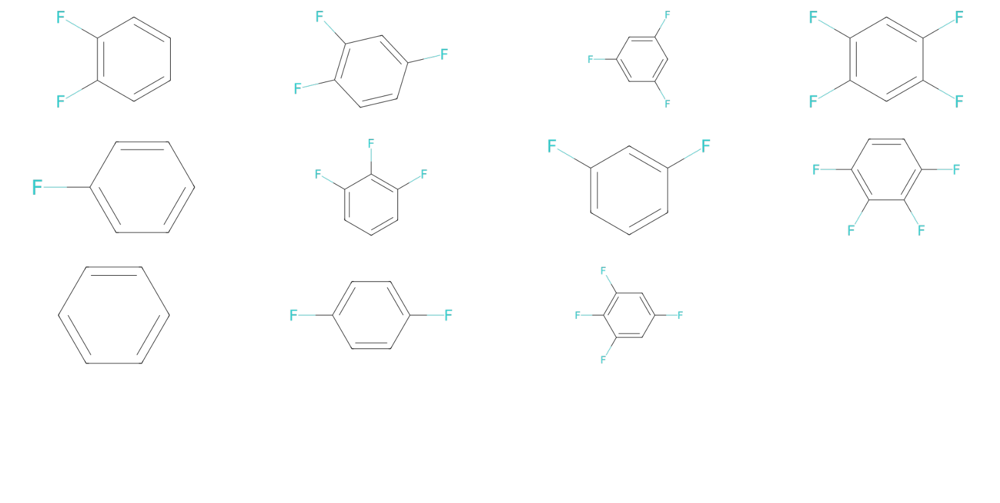

In [8]:
from buildamol.extensions import molecular_factories as mf

benzene = bam.read_smiles("c1ccccc1")
deriv = mf.Derivator(benzene)
for H in benzene.get_hydrogens():
    deriv.element_changable(H, ("H", "F"))
_compounds = set(deriv.all())
seen = set()
ar_frags = []
for i, c in enumerate(_compounds):
    smiles = c.to_smiles()
    if len(c.get_atoms("F", by="element")) > 4:
        seen.add(smiles)
    if smiles not in seen:
        c.id = f"ar{i}"
        c.residues[0].name = f"ar{i}"   
        ar_frags.append(c)
        seen.add(smiles)

fig, axs = plt.subplots(4, 4, figsize=(20, 10))
for i, compound in enumerate(ar_frags):
    ax = axs[i // 4, i % 4]
    compound.draw2d(ax=ax)  
for ax in axs.flatten():
    ax.axis("off")  

Next, let's get some fragments to attach to the Carbon. There is more flexibility here, so let's use ChEMBL to obtain some potential candidates

In [9]:
# c_frags = mf.get_chembl_fragments(n=100, max_mw=100)
# cfrag_library = bam.MoleculeLibrary.from_molecules(c_frags)
# cfrag_library.save("files/chembl_100.pkl")
c_frags = bam.MoleculeLibrary.load("files/chembl_100.pkl").molecules

fig, axs = plt.subplots(10, 10, figsize=(20, 20))
for i, frag in enumerate(c_frags):
    ax = axs[i // 10, i % 10]
    frag.draw2d(ax=ax)

Error in callback <function flush_figures at 0x148d5c040> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

## Setting up the Assembler

Now that we have fragments to work with, we can set up an `Assembler` class to combine fragments into potential antibiotic candidates. Why do we need to make a custom Assembler rather than just passing the list of molecules to a `Generator` directly? Well, we have prior knowledge of how the molecules should be structured, e.g. that the 5-membered central ring always attaches via `N` and `C5`. We could simply handle all these checks in postprocessing and discard candidates that violate these rules, but then we potentially spend a ton of compute on candidates that we cannot use. The Assembler allows us to directly edit the assembly rules to some degree, making sure that we always follow at least some reasonable patterns and thus reducing the wasted compute. 

Here's how we can set up a custom Assembler for our needs

In [ ]:
core_ring = "O1C(=O)NCC1"
core_ring = bam.read_smiles(core_ring, id="ox").autolabel()
_N = lambda mol: mol.get_atom("N", by="element")
_C = lambda mol: mol.get_atom("C2")
_CH = lambda mol, atom: atom.get_left_hydrogen()

N = _N(core_ring)
C = _C(core_ring)
attachment_points = N, C
deletion_points = N.get_hydrogens().pop(), _CH(core_ring, C)

v = core_ring.draw3d()
for a in attachment_points:
    v.draw_atom(a, color="pink", size=5)
for a in deletion_points:
    v.draw_atom(a, color="orange", size=5)
v.show()

In [ ]:
A_Rs = mf.Assembler(c_frags, optimization_steps=10)
Rs = list(A_Rs.sample(3, 20)) +  list(A_Rs.sample(2, 100))

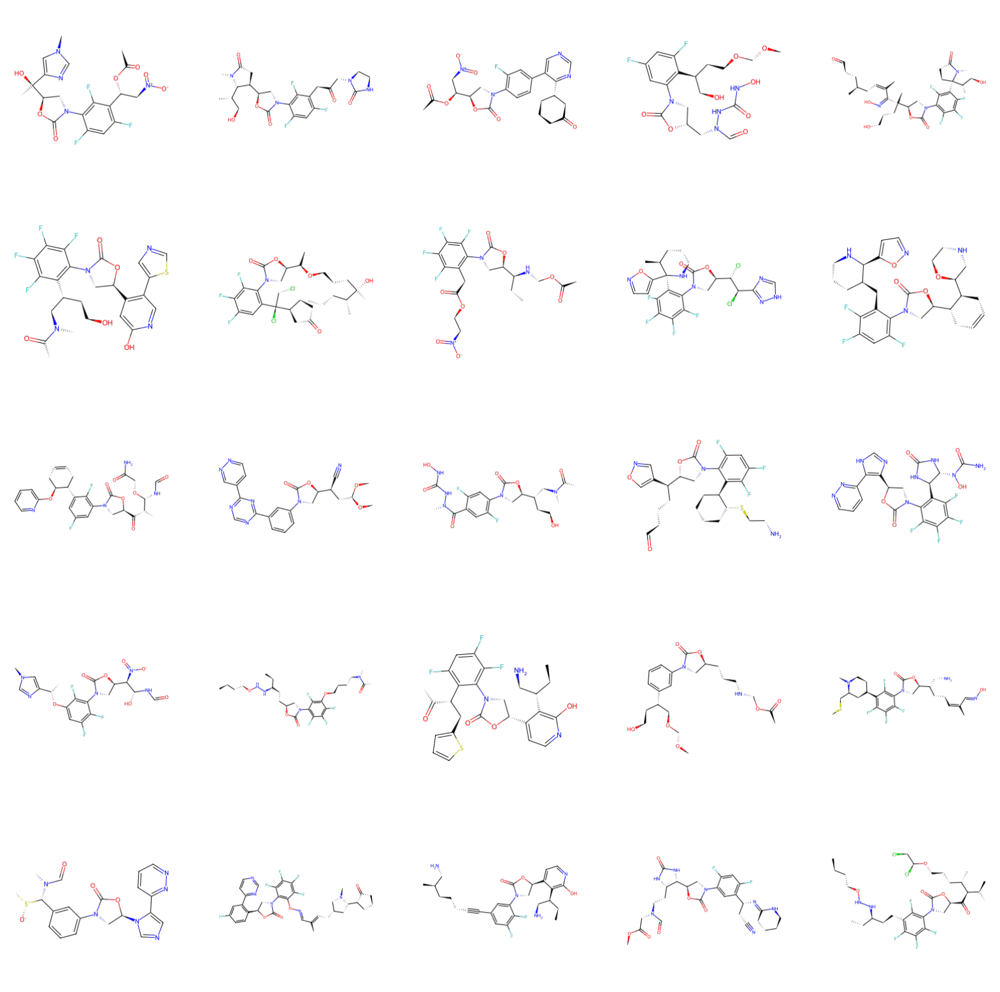

In [ ]:
p_R1 = mf.Choice(Rs) | mf.FindLinkerAtoms()
p_R2 = mf.Choice(Rs) | mf.FindLinkerAtoms()
p_ar = mf.Choice(ar_frags) | mf.FindLinkerAtoms() | mf.Connect(p_R2) | mf.SetAttachResidue(1) | mf.FindLinkerAtoms()
p_core = mf.Compound(core_ring) | mf.SetAttachResidue(1) | mf.SetLinkerAtoms(link=_C, delete=_CH) | mf.Connect(p_R1) | mf.SetAttachResidue(1) | mf.SetLinkerAtoms(link=_N) | mf.Connect(p_ar) | mf.Optimize() 

fig, axs = plt.subplots(5, 5, figsize=(20, 20))

for _ in range(25):
    ctx = p_core()
    ctx.molecule.draw2d(ax=axs[_ // 5, _ % 5])
    
# print(ctx.linker_atom, ctx.deleter_atom)
# v = ctx.molecule.draw3d()
# # v.draw_atom(ctx.linker_atom, color="pink", size=15)
# # v.draw_atom(ctx.deleter_atom, color="orange", size=15)
# v.show()

In [ ]:
from admet_ai import ADMETModel
import contextlib
import io

admet_model = ADMETModel()


# because the predict method by default prints out a lot of additional information
# we wrap it to surpress the output, so that it doesn't clutter the notebook
if not hasattr(admet_model, "_original_predict"):
    admet_model._original_predict = admet_model.predict

def _quiet_predict(*args, **kwargs):
    with (
        contextlib.redirect_stdout(io.StringIO()),
        contextlib.redirect_stderr(io.StringIO()),
    ):
        return admet_model._original_predict(*args, **kwargs)

admet_model.predict = _quiet_predict

test_smiles = "Cc1ccc(NC(=O)c2ccc(CN3CCN(C)CC3)cc2)cc1"
preds = admet_model.predict(smiles=test_smiles)

# print a selection of the ~85 available properties
keys_of_interest = [
    "HIA_Hou",          # human intestinal absorption   [0 = poor, 1 = good]
    "Bioavailability_Ma",  # oral bioavailability          [0 = poor, 1 = good]
    "hERG",             # hERG channel inhibition risk  [0 = safe, 1 = risky]
    "AMES",             # Ames mutagenicity             [0 = safe, 1 = mutagenic]
    "ClinTox",          # clinical toxicity             [0 = safe, 1 = toxic]
    "QED",              # quantitative estimate of drug-likeness [0-1]
]
for k in keys_of_interest:
    print(f"  {k:<28}  {preds[k]:.3f}")

Loading pretrained parameter "encoder.encoder.0.cached_zero_vector".
Loading pretrained parameter "encoder.encoder.0.W_i.weight".
Loading pretrained parameter "encoder.encoder.0.W_h.weight".
Loading pretrained parameter "encoder.encoder.0.W_o.weight".
Loading pretrained parameter "encoder.encoder.0.W_o.bias".
Loading pretrained parameter "readout.1.weight".
Loading pretrained parameter "readout.1.bias".
Loading pretrained parameter "readout.4.weight".
Loading pretrained parameter "readout.4.bias".
Loading pretrained parameter "encoder.encoder.0.cached_zero_vector".
Loading pretrained parameter "encoder.encoder.0.W_i.weight".
Loading pretrained parameter "encoder.encoder.0.W_h.weight".
Loading pretrained parameter "encoder.encoder.0.W_o.weight".
Loading pretrained parameter "encoder.encoder.0.W_o.bias".
Loading pretrained parameter "readout.1.weight".
Loading pretrained parameter "readout.1.bias".
Loading pretrained parameter "readout.4.weight".
Loading pretrained parameter "readout.4.b

In [ ]:
from rdkit.Contrib.SA_Score import sascorer
def sa_score(mol):
    # compute the synthetic accessibility score for a molecule, scaled to [0, 1]
    # the original score is in [1, 10], where 1 = easy to synthesize and 10 = very difficult
    return (sascorer.calculateScore(mol.to_rdkit()) - 1) / 9
sa_score(bam.read_smiles(test_smiles))

0.629618241334251

In [ ]:
def reward(mol, pred=None):
    if pred is None:
        pred = admet_model.predict(smiles=mol.to_smiles())
    absorption     = pred["HIA_Hou"]           
    bioavailability= pred["Bioavailability_Ma"] 
    qed = pred["QED"]                     
    return absorption + bioavailability + 2 * qed

def penality(mol, pred=None):
    if pred is None:
        pred = admet_model.predict(smiles=mol.to_smiles())
    herg           = pred["hERG"]              
    ames           = pred["AMES"]               
    clintox         = pred["ClinTox"]            
    return herg + ames + clintox

def admet_score(mol):
    pred = admet_model.predict(smiles=mol.to_smiles())
    r = reward(mol, pred=pred)
    p = penality(mol, pred=pred)
    sa = sa_score(mol)
    return r - p - 2 * sa


In [ ]:
O = mf.Optimizer(p_core, admet_score)
# O.run("random", steps=1000, n_workers=1)
O.run("swarm", steps=30, population=30, n_workers=30)
# 10:33

pso:   0%|          | 0/30 [00:00<?, ?it/s]




























































































































model ensembles: 100%|██████████| 2/2 [00:00<00:00,  2.17it/s]


In [ ]:
top_k = 50
top_k = O.top(top_k)

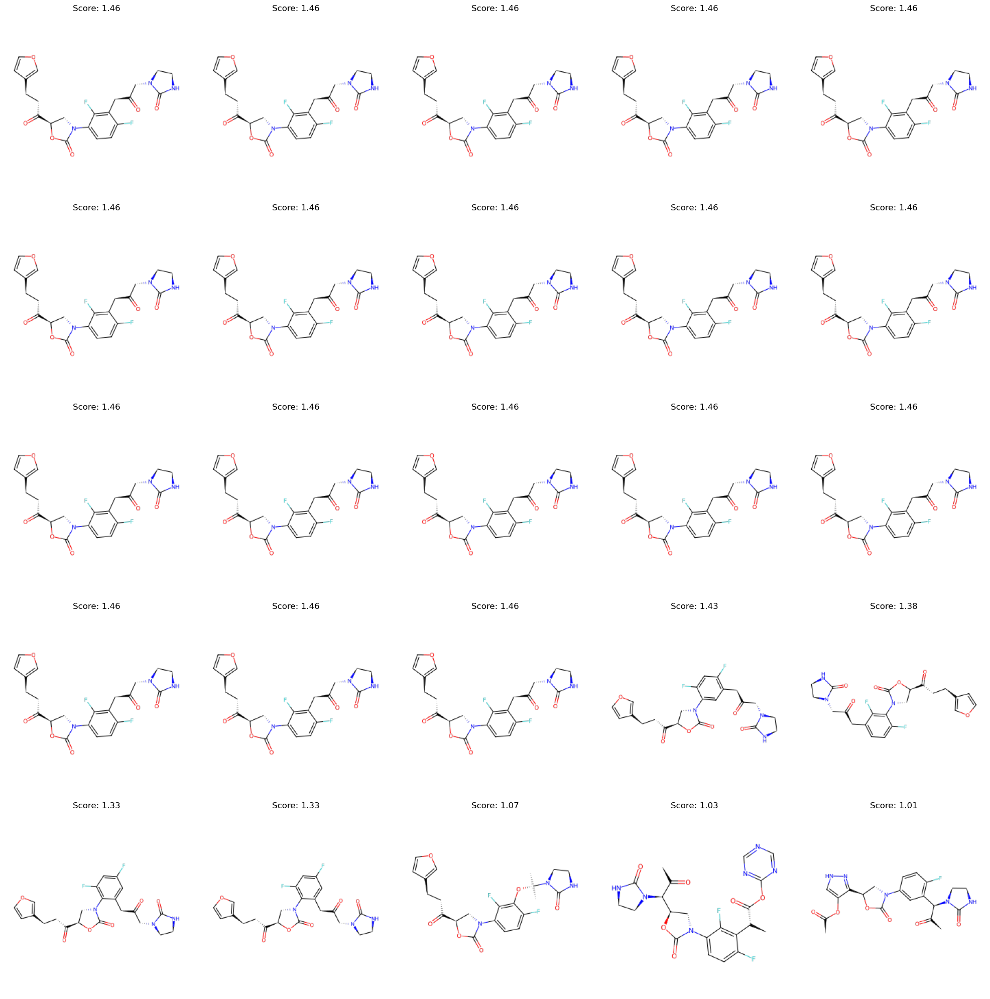

In [ ]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(5, 5, figsize=(20, 20))
for i, mol in enumerate(top_k[:len(axs.flatten())]):
    ax = axs[i // 5, i % 5]
    mol.draw2d(ax=ax)
    ax.set_title(f"Score: {admet_score(mol):.2f}")
    
fig.tight_layout()

In [4]:
oxazolidinone_names =[  
"Linezolid",
"Posizolid",
"Tedizolid",
"Cycloserine",
"Cadazolid",
"Contezolid",
"Sutezolid",
"Radezolid",
"Ranbezolid",
"Eperezolid",
]
# oxazolidinones = [bam.Molecule.from_pubchem(name) for name in oxazolidinone_names]
# oxazolidinones = bam.MoleculeLibrary.from_molecules(oxazolidinones)
# oxazolidinones.save("files/oxazolidinones.pkl")
oxazolidinones = bam.MoleculeLibrary.load("files/oxazolidinones.pkl").molecules

In [ ]:
def evaluate(mol):
    scores = {}
    smi = mol.to_smiles()
    pred = admet_model.predict(smiles=smi)
    scores["HIA_Hou"] = pred["HIA_Hou"]
    scores["Bioavailability_Ma"] = pred["Bioavailability_Ma"]
    scores["hERG"] = pred["hERG"]
    scores["AMES"] = pred["AMES"]
    scores["ClinTox"] = pred["ClinTox"]
    scores["QED"] = pred["QED"]
    scores["SA"] = sa_score(mol)
    return scores

oxazolidinone_scores = [evaluate(mol) for mol in oxazolidinones]
top_k_scores = [evaluate(mol) for mol in top_k]

In [ ]:
import pandas as pd 
ox_df = pd.DataFrame(oxazolidinone_scores, index=[mol.to_smiles() for mol in oxazolidinones])
top_df = pd.DataFrame(top_k_scores, index=[mol.to_smiles() for mol in top_k])
ox_df["molecule"] = oxazolidinones
top_df["molecule"] = top_k
ox_df["set"] = "oxazolidinones"
top_df["set"] = "generated"

ox_df["name"] = oxazolidinone_names
top_df["name"] = [f"gen_{i}" for i in range(len(top_df))]

for df in (ox_df, top_df):
    df["score"] = df["HIA_Hou"] + df["Bioavailability_Ma"] + 0.5 * df["QED"] - df["hERG"] - df["AMES"] - df["ClinTox"] - df["SA"]
df = pd.concat([ox_df, top_df])
df.head()

,HIA_Hou,Bioavailability_Ma,hERG,AMES,ClinTox,QED,SA,molecule,set,name,score
CC(=O)NC[C@H]1CN(c2ccc(N3CCOCC3)c(F)c2)C(=O)O1,0.993658,0.954033,0.172261,0.863216,0.383506,0.891597,0.476828,Molecule N-[[(5S)-3-(3-fluoro-4-morpholin-4-yl...,oxazolidinones,Linezolid,0.497678
O=C([C@@H](O)CO)N1CC=C(c2c(F)cc(N3C[C@H](COc4ccon4)OC3=O)cc2F)CC1,0.990252,0.829927,0.534319,0.748572,0.660213,0.627467,0.659304,"Molecule (5R)-3-[4-[1-[(2S)-2,3-dihydroxypropa...",oxazolidinones,Posizolid,-0.468496
Cn1nnc(-c2ccc(-c3ccc(N4C[C@H](CO)OC4=O)cc3F)cn2)n1,0.997747,0.973777,0.170840,0.761555,0.547053,0.739645,0.712053,Molecule (5R)-3-[3-fluoro-4-[6-(2-methyltetraz...,oxazolidinones,Tedizolid,0.149846
N[C@@H]1CONC1=O,0.999458,0.991877,0.023665,0.991676,0.120592,0.385893,0.723721,"Molecule (4R)-4-amino-1,2-oxazolidin-3-one:\nR...",oxazolidinones,Cycloserine,0.324627
O=C(O)c1cn(C2CC2)c2cc(N3CCC(O)(COc4ccc(N5C[C@H](CO)OC5=O)cc4F)CC3)c(F)cc2c1=O,0.646041,0.827302,0.163160,0.525962,0.341916,0.363744,0.751336,Molecule 1-cyclopropyl-6-fluoro-7-[4-[[2-fluor...,oxazolidinones,Cadazolid,-0.127159


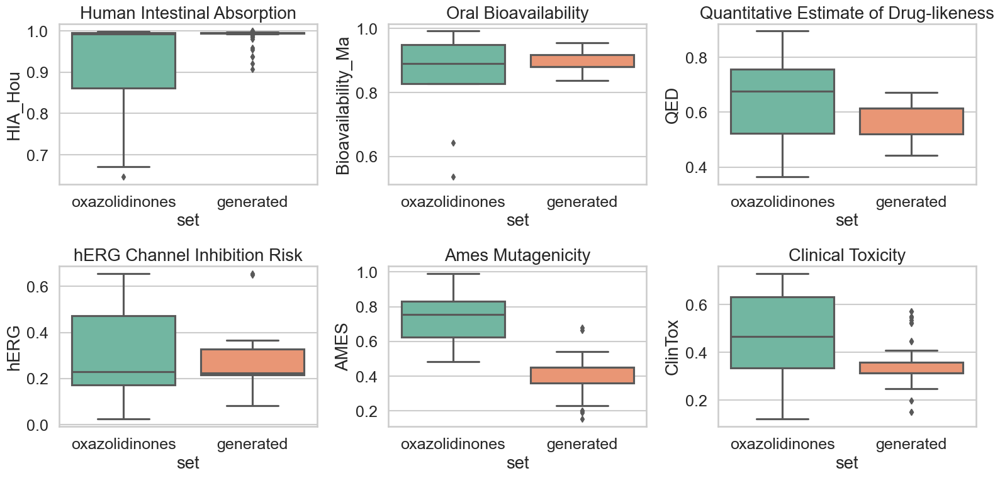

In [ ]:
import seaborn as sns
sns.set_theme(style="whitegrid")
sns.set_context("talk", font_scale=1.1)
sns.set_palette("Set2")

fig, axs = plt.subplots(2, 3, figsize=(16, 8))

sns.boxplot(x="set", y="HIA_Hou", data=df, ax=axs[0, 0])
axs[0, 0].set_title("Human Intestinal Absorption")
sns.boxplot(x="set", y="Bioavailability_Ma", data=df, ax=axs[0, 1])
axs[0, 1].set_title("Oral Bioavailability")
sns.boxplot(x="set", y="QED", data=df, ax=axs[0, 2])
axs[0, 2].set_title("Quantitative Estimate of Drug-likeness")

sns.boxplot(x="set", y="hERG", data=df, ax=axs[1, 0])
axs[1, 0].set_title("hERG Channel Inhibition Risk")
sns.boxplot(x="set", y="AMES", data=df, ax=axs[1, 1])
axs[1, 1].set_title("Ames Mutagenicity")
sns.boxplot(x="set", y="ClinTox", data=df, ax=axs[1, 2])
axs[1, 2].set_title("Clinical Toxicity")

fig.tight_layout()

Text(17.08333333333333, 0.5, 'Synthetic Accessibility Score ($\\downarrow$)')

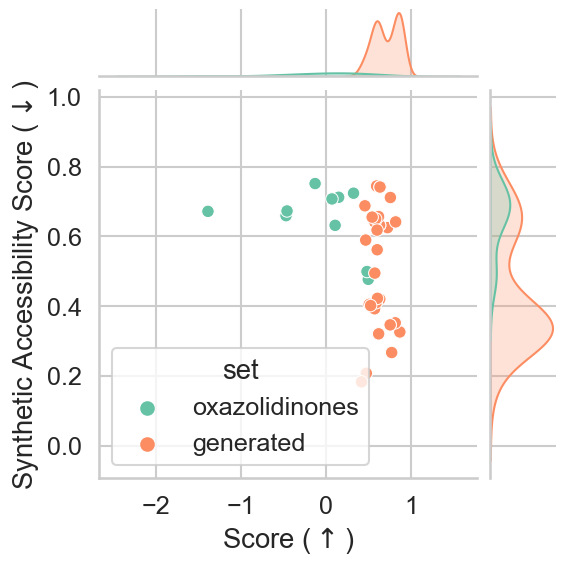

In [ ]:
grid = sns.jointplot(data=df, x="score", y="SA", hue="set", kind="scatter", height=6)
ax = grid.ax_joint
ax.set_xlabel("Score ($\\uparrow$)")
ax.set_ylabel("Synthetic Accessibility Score ($\\downarrow$)")

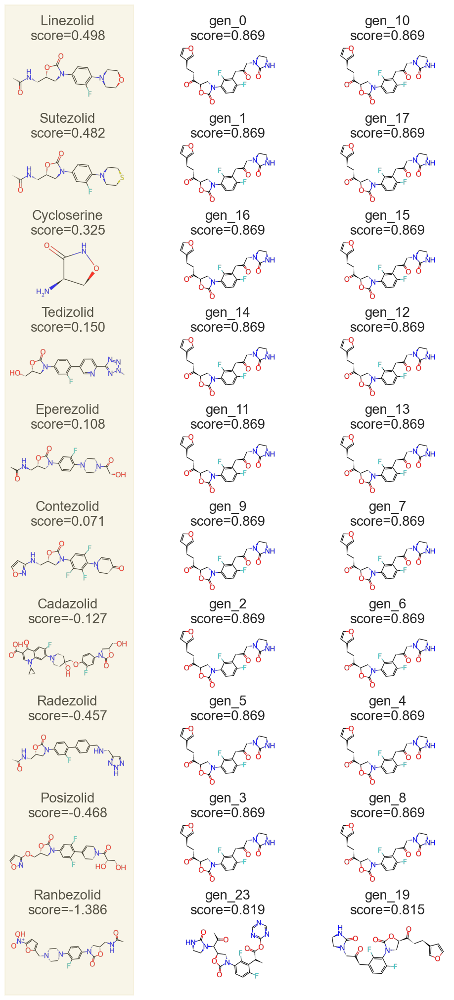

In [ ]:
fig, axs = plt.subplots(10, 3, figsize=(10, 20))

for i, entry in enumerate(ox_df.sort_values("score", ascending=False).to_dict(orient="records")):
    ax = axs[i, 0]
    
    mol = entry["molecule"]
    name = entry["name"]
    ax.imshow(mol.draw2d().draw(fontsize=60, linewidth=5))
    ax.set_title(f"{name}\nscore={entry['score']:.3f}")
    ax.axis("off")
    
for i, entry in enumerate(top_df.sort_values("score", ascending=False).to_dict(orient="records")):
    try:
        ax = axs[:, 1:].flat[i]
    except IndexError:
        break 
    mol = entry["molecule"]
    name = entry["name"]
    ax.imshow(mol.draw2d().draw(fontsize=60, linewidth=5))
    ax.set_title(f"{name}\nscore={entry['score']:.3f}")
    ax.axis("off")

fig.patches.extend([plt.Rectangle((0.05,0.0),0.26,1.0,
                                  fill=True, color='xkcd:beige', alpha=0.25, zorder=1000,
                                  transform=fig.transFigure, figure=fig)])

fig.tight_layout()

-----

In [1]:
import buildamol as bam 
bam.utils.visual.set_backend("py3dmol")

In [ ]:
from time import time

bam.load_amino_acids()
bam.load_nucleotides()
ribosome = bam.read_pdb("/Users/noahhk/Desktop/6gwt.pdb")
ribosome.bonds = []

import numpy as np
pocket_center = np.mean([i.coord for i in ribosome.get_chain("x").get_atoms()], axis=0)
ribosome.drop_chains("x", "z")
ribosome.drop_residues(ribosome.get_residue("GCP"))
ribosome.reindex()

for res in ribosome.get_residues():
    if np.linalg.norm(res.coord - pocket_center) > 21:
        ribosome.drop_residues(res)

from buildamol.extensions.bio.proteins import apply_peptide_bonds
from buildamol.extensions.bio.nucleic_acids import apply_phosphodiester_bonds

ribosome.apply_standard_bonds()        # intra-residue bonds
apply_peptide_bonds(ribosome)          # C→N between protein residues
apply_phosphodiester_bonds(ribosome)   # O3'→P between RNA/DNA residues
# ribosome.add_hydrogens()

print(ribosome.count_residues())
# ribosome = bam.Molecule.load("ribosome.pkl")


5598


In [3]:
ribosome.show3d()

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [15]:
from buildamol.extensions.docking import backend_easydock
oxazolidinones = bam.MoleculeLibrary.load("files/oxazolidinones.pkl").molecules
docked = backend_easydock.dock(ribosome, oxazolidinones[0], center=pocket_center, box_size=(20, 20, 20), ncpu=4, exhaustiveness=2, n_poses=1,)

/Users/noahhk/anaconda3/envs/glyco2/lib/python3.11/tempfile.py:895: ResourceWarning: Implicitly cleaning up <TemporaryDirectory './tmpaxuzkkpb'>
  _warnings.warn(warn_message, ResourceWarning)
/Users/noahhk/anaconda3/envs/glyco2/lib/python3.11/subprocess.py:1123: ResourceWarning: subprocess 63461 is still running
  _warn("subprocess %s is still running" % self.pid,


KeyboardInterrupt: 

In [16]:
from buildamol.extensions.docking import backend_dockstring

In [17]:
docked = backend_dockstring.dock(
    ribosome, oxazolidinones[0], center=pocket_center, box_size=(20, 20, 20), num_cpus=4
)

/Users/noahhk/anaconda3/envs/glyco2/lib/python3.11/tempfile.py:895: ResourceWarning: Implicitly cleaning up <TemporaryDirectory './tmpezyp9tfq'>
  _warnings.warn(warn_message, ResourceWarning)
[RDKit] ERROR:[16:56:38] Explicit valence for atom # 59911 C, 5, is greater than permitted


KeyboardInterrupt: 